In [5]:
# Importing required libraries
import numpy as np
import cv2
import matplotlib.pyplot as plt
import numba
from numba import jit
import time

In [6]:
# This method is for checking if the given coordinate of a pixel is valid or not
@jit(nopython=True)
def is_valid(x, y, rows, cols) :    
    if(x>=0 and x<rows) :
        if(y>=0 and y<cols) :
            return 1
    return 0


# This method returns the energy matrix of a given image
@jit(nopython=True)
def find_energy(image) :
    # Finding the size of the image passed as argument
    rows, cols, channels = np.shape(image)
    
    # Creating an energy matrix
    energy_matrix = np.zeros((rows, cols))
    
    for i in range(rows) :
        for j in range(cols) :
            if(is_valid(i-1, j, rows, cols) and is_valid(i+1, j, rows, cols)) :
                energy_matrix[i][j] += ((image[i+1][j]-image[i-1][j])**2).sum()
            elif(is_valid(i-1, j, rows, cols)) :
                energy_matrix[i][j] += ((image[i][j]-image[i-1][j])**2).sum()
            elif(is_valid(i+1, j, rows, cols)) :
                energy_matrix[i][j] += ((image[i][j]-image[i+1][j])**2).sum()

            if(is_valid(i, j+1, rows, cols) and is_valid(i, j-1, rows, cols)) :
                energy_matrix[i][j] += ((image[i][j+1]-image[i][j-1])**2).sum()
            elif(is_valid(i, j+1, rows, cols)) :
                energy_matrix[i][j] += ((image[i][j+1]-image[i][j])**2).sum()
            elif(is_valid(i, j-1, rows, cols)) :
                energy_matrix[i][j] += ((image[i][j-1]-image[i][j])**2).sum()
    
    return energy_matrix

# Method for filling the dp matrix
@jit(nopython=True)
def fill_dp(dp, energy_matrix) :
    # Finding the size of the image passed as argument
    rows, cols = np.shape(energy_matrix)
    
    for i in range(rows-1, -1, -1) :
        if(i == rows-1) :
            dp[i] = energy_matrix[i]
        else :
            for j in range(cols) :
                min_energy_sum = dp[i+1][j]
                
                if(is_valid(i+1, j+1, rows, cols)) :
                    min_energy_sum = min(min_energy_sum, dp[i+1][j+1])
                if(is_valid(i+1, j-1, rows, cols)) :
                    min_energy_sum = min(min_energy_sum, dp[i+1][j-1])
                    
                dp[i][j] = energy_matrix[i][j]+min_energy_sum
    return dp


# Method for finding the seam
@jit(nopython=True)
def find_seam(start, dp) :
    rows, cols = np.shape(dp)
    
    seam = np.zeros((rows,2), dtype=numba.int32)
    index = 0
    
    while(is_valid(start[0], start[1], rows, cols)) :
        seam[index] = start
        index += 1
        
        min_energy_sum = 2000000000
        new_start = np.array([-1, -1])
        
        if(is_valid(start[0]+1, start[1], rows, cols) and min_energy_sum>dp[start[0]+1][start[1]]) :
            new_start[0] = start[0]+1
            new_start[1] = start[1]
            min_energy_sum = dp[start[0]+1][start[1]]
            
        if(is_valid(start[0]+1, start[1]+1, rows, cols) and min_energy_sum>dp[start[0]+1][start[1]+1]) :
            new_start[0] = start[0]+1
            new_start[1] = start[1]+1
            min_energy_sum = dp[start[0]+1][start[1]+1]
        
        if(is_valid(start[0]+1, start[1]-1, rows, cols) and min_energy_sum>dp[start[0]+1][start[1]-1]) :
            new_start[0] = start[0]+1
            new_start[1] = start[1]-1
            min_energy_sum = dp[start[0]+1][start[1]-1]
            
        start = new_start
        
    return seam

# Method to delete a pixel from an image
@jit(nopython=True)
def delete_pixels(seam, image) :
    for pixel in seam :
        x = pixel[0]
        y = pixel[1]
        
        rows, cols, channels = np.shape(image)
        
        for i in range(y+1, cols) :
            image[x][i-1] = image[x][i]


def seam_carving(image, number) :
    # Making the copy of the image to return
    carved_image = np.copy(image)
    
    # We need to loop 'number' times
    for i in range(number) :
        rows, cols, channels = np.shape(carved_image)
        # This is the dp matrix
        dp = np.zeros((rows, cols))
        
        # Finding the energy matrix
        energy_matrix = find_energy(carved_image)
        
        # Function for filling the dp matrix
        fill_dp(dp, energy_matrix)
        
        # Finding the starting point
        start = np.array([0, np.argmin(dp[0])])
        
        seam = find_seam(start, dp)
        # seam = seam.astype('int')
        
        delete_pixels(seam, carved_image)
        
        carved_image = np.delete(carved_image, -1, 1)
    
    return carved_image

In [22]:
# This method returns the time taken for horizontal shriking of an image
def time_horizontal_carving(img, perc) :
    # Noting down the starting time
    tic = time.time()

    rows, cols, channels = np.shape(img)

    num = int(cols*perc/100)

    carved_img = seam_carving(img, num)

    # Ending time
    toc = time.time()

    print("Size of original image : " + str(img.shape[0])+', '+str(img.shape[1]))
    print("Size of " + str(perc) + "% horizontal shrinked image : " + str(carved_img.shape[0])+', '+str(carved_img.shape[1]))

    plt.figure(figsize=[15, 15])
    plt.subplot(121)
    plt.axis('off')
    plt.imshow(img)
    plt.subplot(122)
    plt.axis('off')
    plt.imshow(carved_img)
    plt.title(str(perc)+'% horizontal shrinkage')
    plt.show()


    time_taken = toc-tic

    print("time taken : " + str(time_taken) + " seconds")
    print("----------------------------------------------------------------------------------------------------------------")

    # Returning the time in seconds
    return time_taken


# This method returns the time taken for vertical shriking of an image
def time_vertical_carving(img, perc) :
    # Noting down the starting time
    tic = time.time()

    transposed_img = np.transpose(img, axes=(1, 0, 2))

    rows, cols, channels = np.shape(img)

    num = int(cols*perc/100)

    carved_img = seam_carving(transposed_img, num)

    carved_img = np.transpose(carved_img, axes=(1, 0, 2))

    # Ending time
    toc = time.time()

    print("Size of original image : " + str(img.shape[0])+', '+str(img.shape[1]))
    print("Size of " + str(perc) + "% vertically shrinked image : " + str(carved_img.shape[0])+', '+str(carved_img.shape[1]))

    plt.figure(figsize=[15, 15])
    plt.subplot(121)
    plt.axis('off')
    plt.imshow(img)
    plt.subplot(122)
    plt.axis('off')
    plt.imshow(carved_img)
    plt.title(str(perc)+'% vertical shrinkage')
    plt.show()

    time_taken = toc-tic

    print("time taken : " + str(time_taken) + " seconds")
    print("----------------------------------------------------------------------------------------------------------------")

    # Returning the time in seconds
    return time_taken

## Banglore dancers

Size of original image : 378, 504
Size of 20% horizontal shrinked image : 378, 404


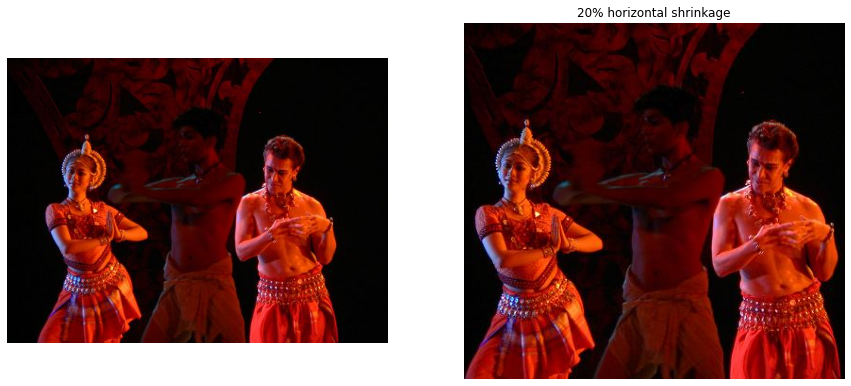

time taken : 7.641636610031128 seconds
----------------------------------------------------------------------------------------------------------------
Size of original image : 378, 504
Size of 40% horizontal shrinked image : 378, 303


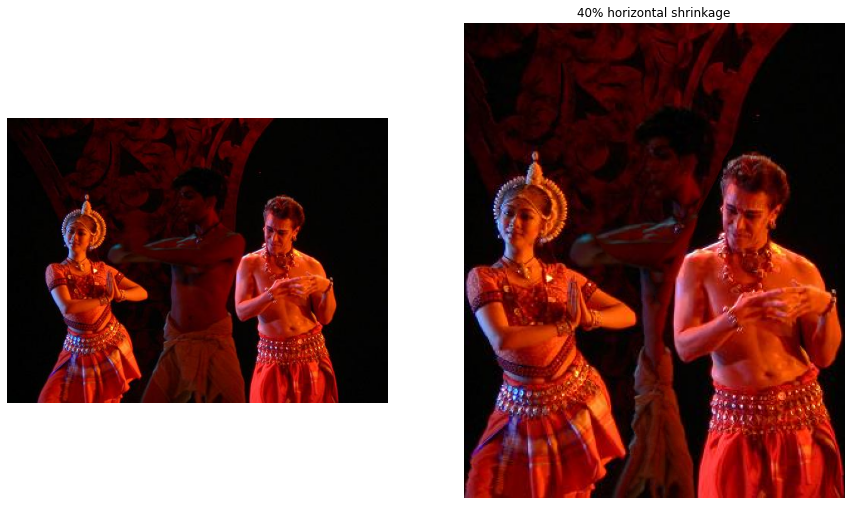

time taken : 13.305218696594238 seconds
----------------------------------------------------------------------------------------------------------------
Size of original image : 378, 504
Size of 60% horizontal shrinked image : 378, 202


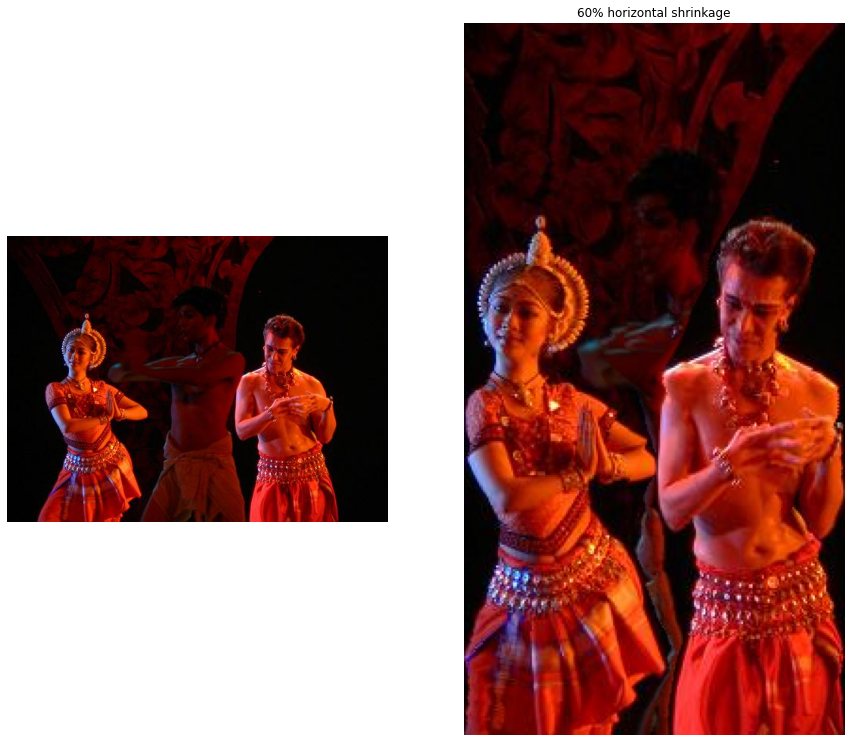

time taken : 15.185643434524536 seconds
----------------------------------------------------------------------------------------------------------------


In [16]:
img = cv2.imread('./images/bangalore-dancers.jpg')
img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)

time_taken = time_horizontal_carving(img, 20)
time_taken = time_horizontal_carving(img, 40)
time_taken = time_horizontal_carving(img, 60)

## Cat

Size of original image : 150, 150
Size of 20% horizontal shrinked image : 150, 120


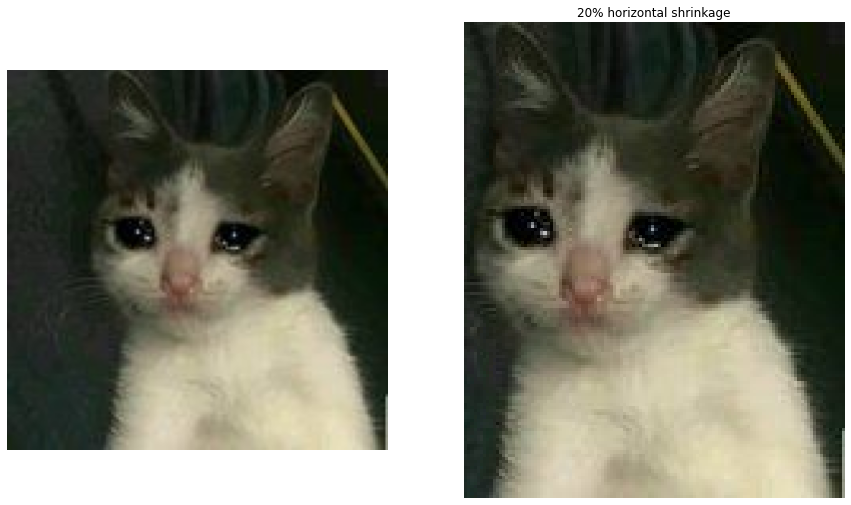

time taken : 0.2789273262023926 seconds
----------------------------------------------------------------------------------------------------------------
Size of original image : 150, 150
Size of 40% horizontal shrinked image : 150, 90


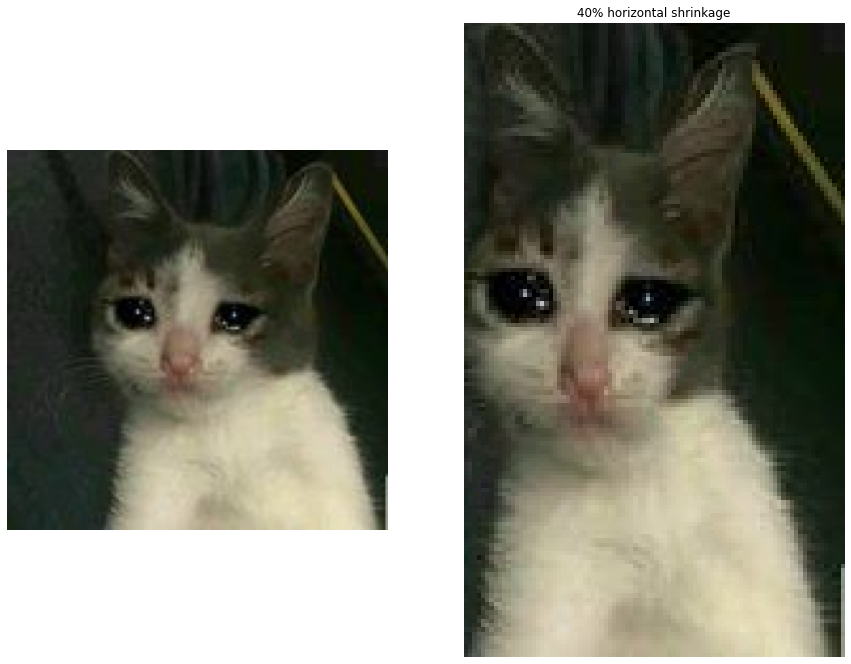

time taken : 0.6067090034484863 seconds
----------------------------------------------------------------------------------------------------------------
Size of original image : 150, 150
Size of 60% horizontal shrinked image : 150, 60


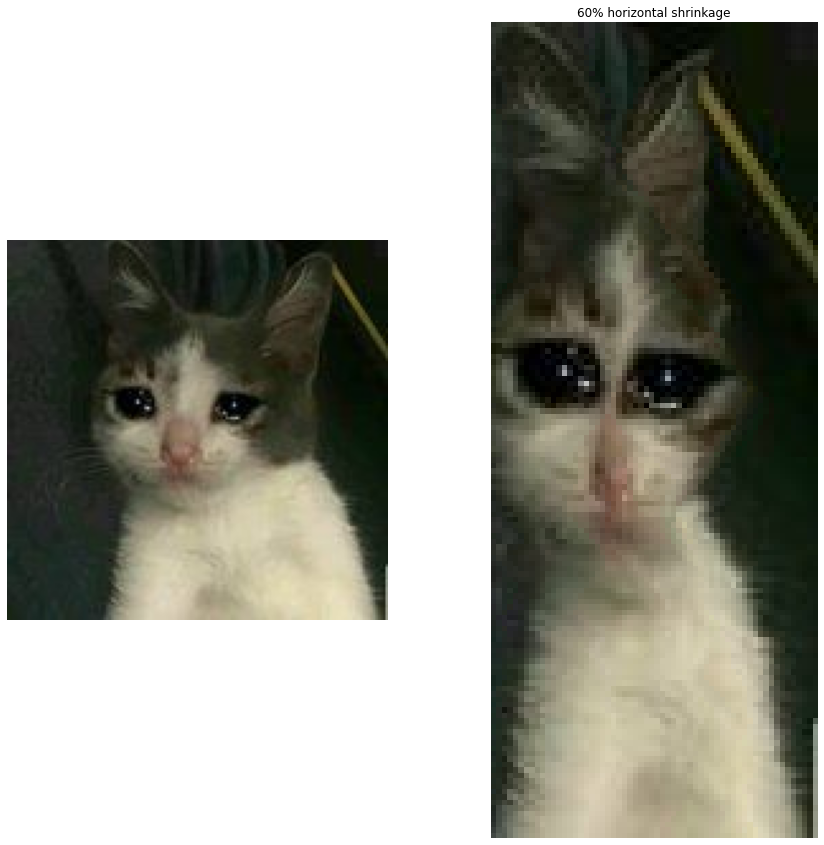

time taken : 0.7256247997283936 seconds
----------------------------------------------------------------------------------------------------------------


In [9]:
img = cv2.imread('./images/cat.jpg')
img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)

time_taken = time_horizontal_carving(img, 20)
time_taken = time_horizontal_carving(img, 40)
time_taken = time_horizontal_carving(img, 60)

## Chhotta bheem

Size of original image : 1200, 1920
Size of 20% horizontal shrinked image : 1200, 1536


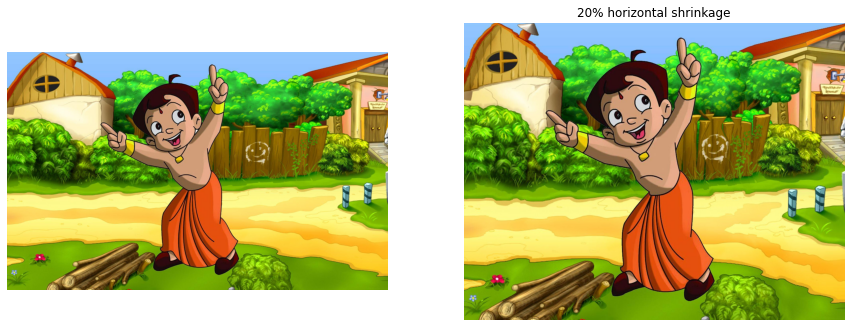

time taken : 398.07217025756836 seconds
----------------------------------------------------------------------------------------------------------------
Size of original image : 1200, 1920
Size of 40% horizontal shrinked image : 1200, 1152


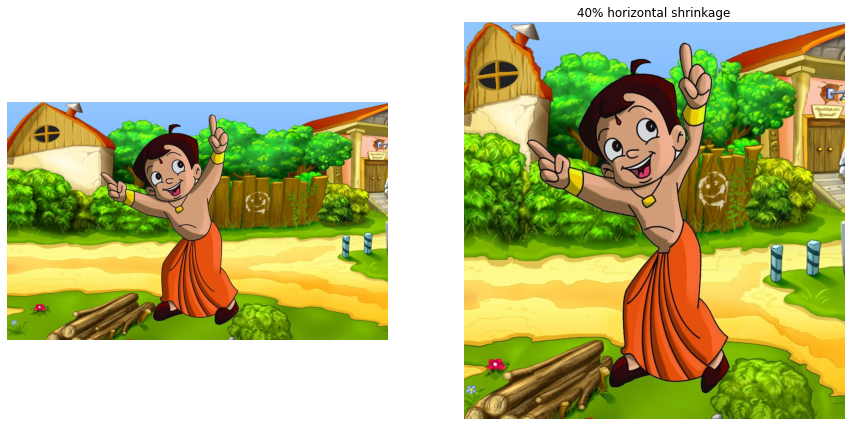

time taken : 632.6559200286865 seconds
----------------------------------------------------------------------------------------------------------------
Size of original image : 1200, 1920
Size of 60% horizontal shrinked image : 1200, 768


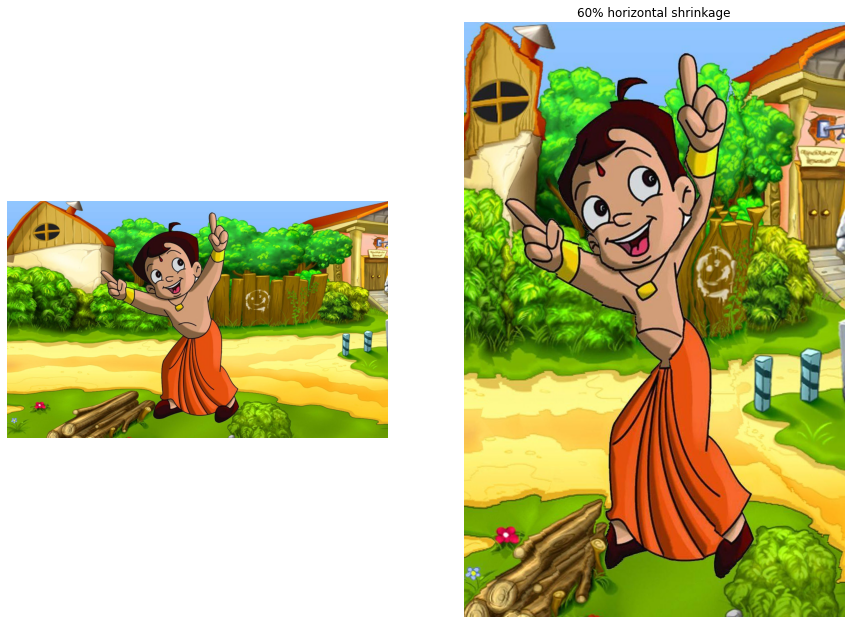

time taken : 623.8963730335236 seconds
----------------------------------------------------------------------------------------------------------------


In [17]:
img = cv2.imread('./images/chhota-bheem.jpg')
img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)

time_taken = time_horizontal_carving(img, 20)
time_taken = time_horizontal_carving(img, 40)
time_taken = time_horizontal_carving(img, 60)

## IIIT

Size of original image : 369, 880
Size of 20% horizontal shrinked image : 369, 704


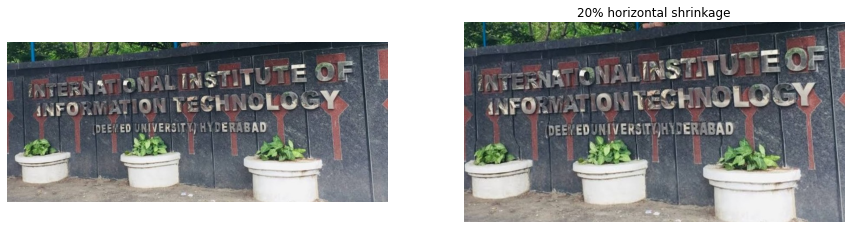

time taken : 25.795539617538452 seconds
----------------------------------------------------------------------------------------------------------------
Size of original image : 369, 880
Size of 40% horizontal shrinked image : 369, 528


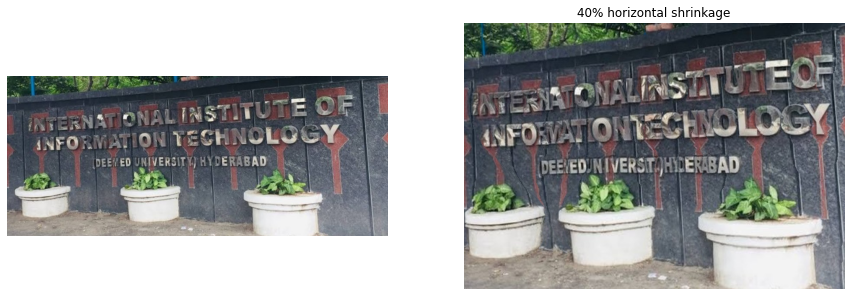

time taken : 45.485169410705566 seconds
----------------------------------------------------------------------------------------------------------------
Size of original image : 369, 880
Size of 60% horizontal shrinked image : 369, 352


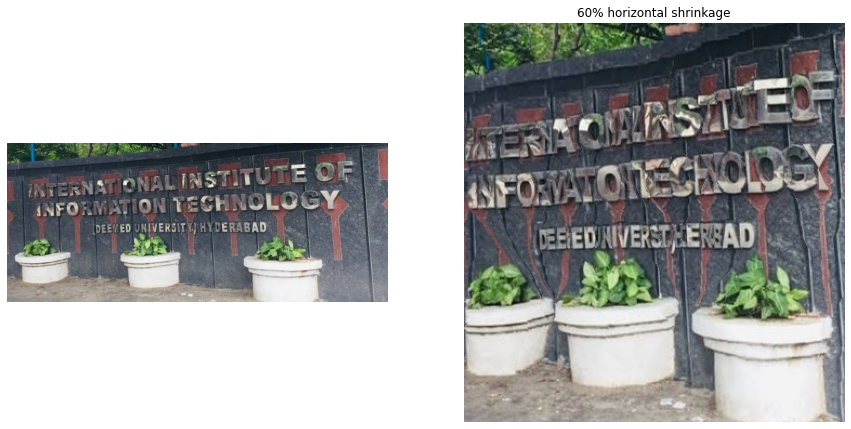

time taken : 60.30500817298889 seconds
----------------------------------------------------------------------------------------------------------------


In [12]:
img = cv2.imread('./images/iiit.jpg')
img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)

time_taken = time_horizontal_carving(img, 20)
time_taken = time_horizontal_carving(img, 40)
time_taken = time_horizontal_carving(img, 60)

## Shadow

Size of original image : 333, 500
Size of 20% horizontal shrinked image : 333, 400


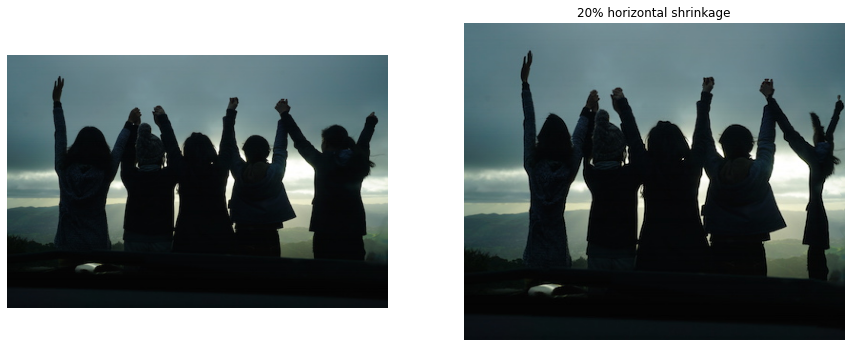

time taken : 7.902309417724609 seconds
----------------------------------------------------------------------------------------------------------------
Size of original image : 333, 500
Size of 40% horizontal shrinked image : 333, 300


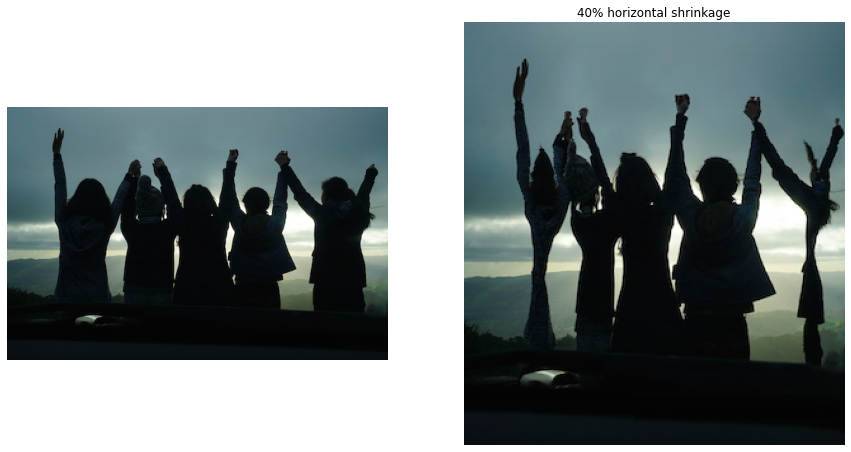

time taken : 12.2704176902771 seconds
----------------------------------------------------------------------------------------------------------------
Size of original image : 333, 500
Size of 60% horizontal shrinked image : 333, 200


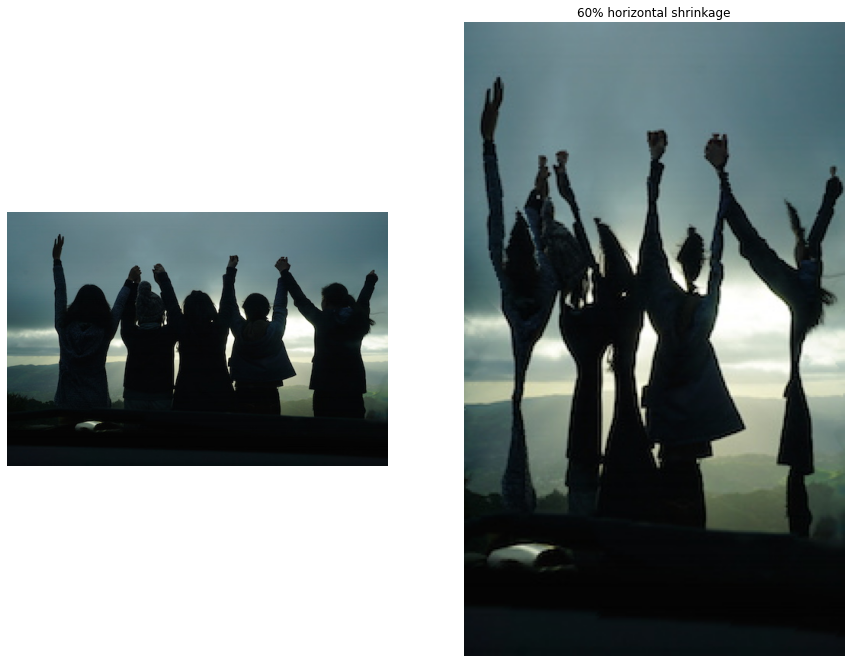

time taken : 16.50081753730774 seconds
----------------------------------------------------------------------------------------------------------------


In [13]:
img = cv2.imread('./images/shadow.jpg')
img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)

time_taken = time_horizontal_carving(img, 20)
time_taken = time_horizontal_carving(img, 40)
time_taken = time_horizontal_carving(img, 60)

## Tanjore

Size of original image : 500, 770
Size of 20% horizontal shrinked image : 500, 616


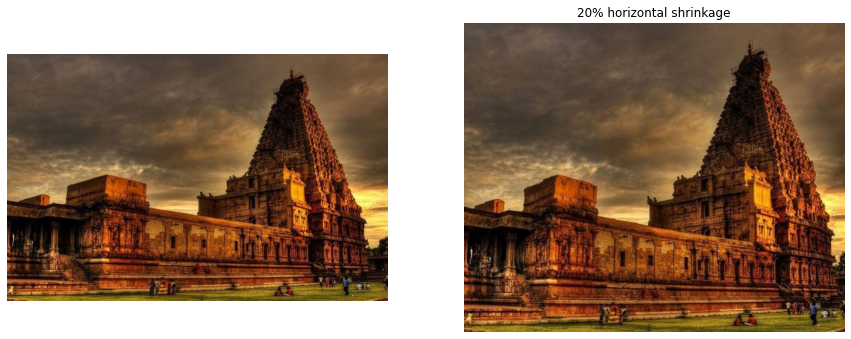

time taken : 22.34966254234314 seconds
----------------------------------------------------------------------------------------------------------------
Size of original image : 500, 770
Size of 40% horizontal shrinked image : 500, 462


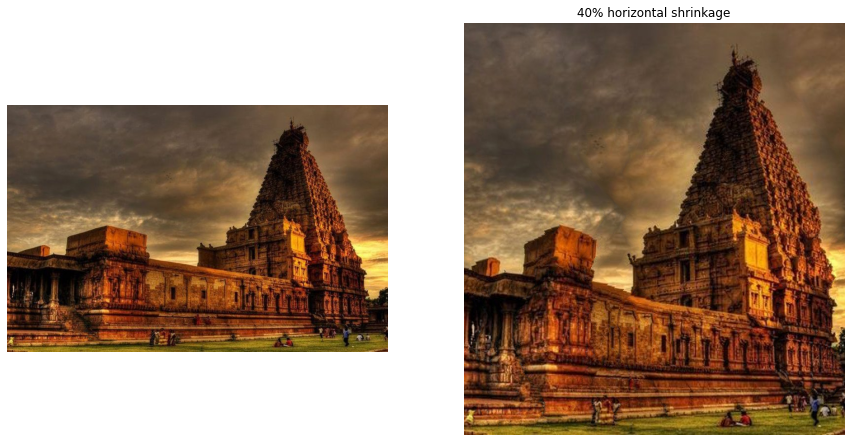

time taken : 37.776567459106445 seconds
----------------------------------------------------------------------------------------------------------------
Size of original image : 500, 770
Size of 60% horizontal shrinked image : 500, 308


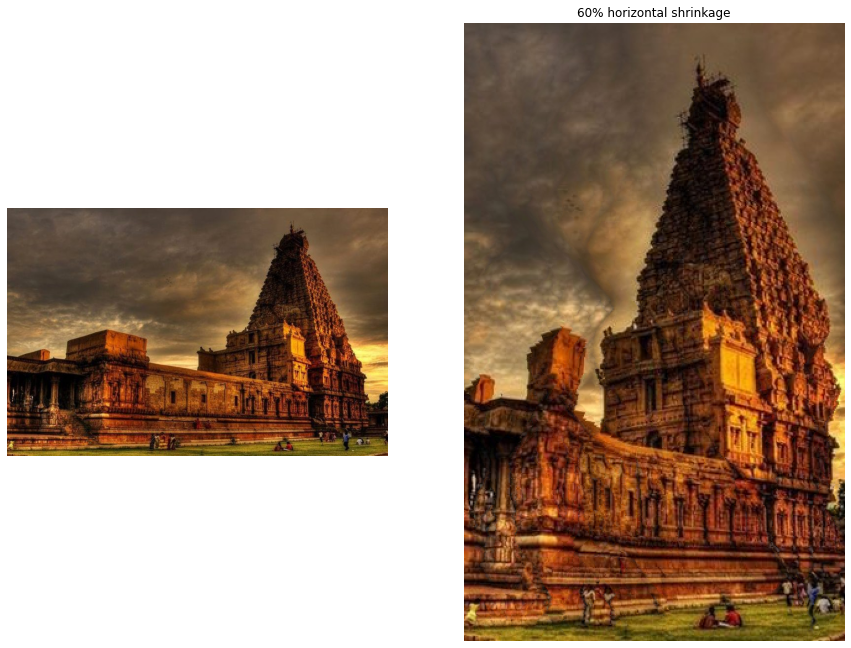

time taken : 47.82666254043579 seconds
----------------------------------------------------------------------------------------------------------------


In [25]:
img = cv2.imread('./images/tanjore.jpg')
img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)

time_taken = time_horizontal_carving(img, 20)
time_taken = time_horizontal_carving(img, 40)
time_taken = time_horizontal_carving(img, 60)

## Trafalgar Square

Size of original image : 319, 359
Size of 20% horizontal shrinked image : 319, 288


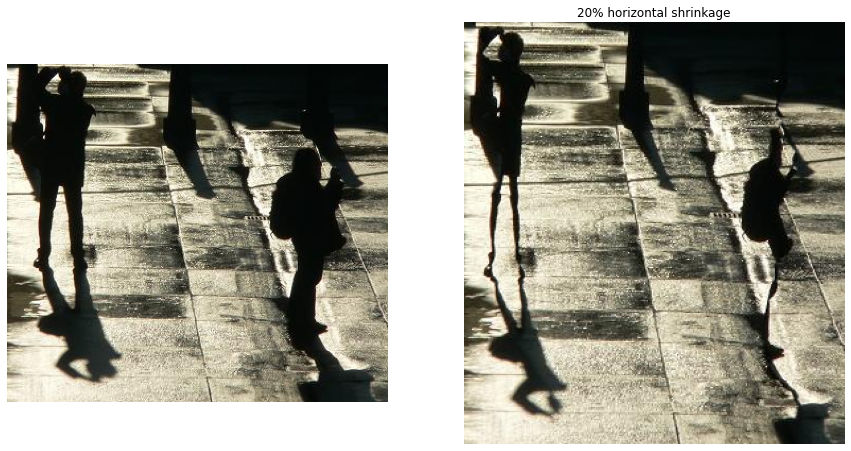

time taken : 3.8061397075653076 seconds
----------------------------------------------------------------------------------------------------------------
Size of original image : 319, 359
Size of 40% horizontal shrinked image : 319, 216


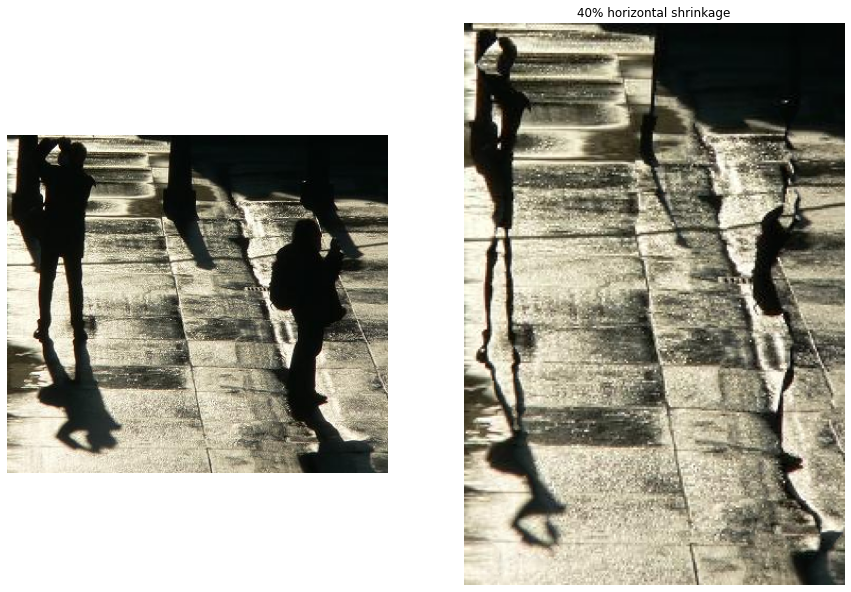

time taken : 6.750384330749512 seconds
----------------------------------------------------------------------------------------------------------------
Size of original image : 319, 359
Size of 60% horizontal shrinked image : 319, 144


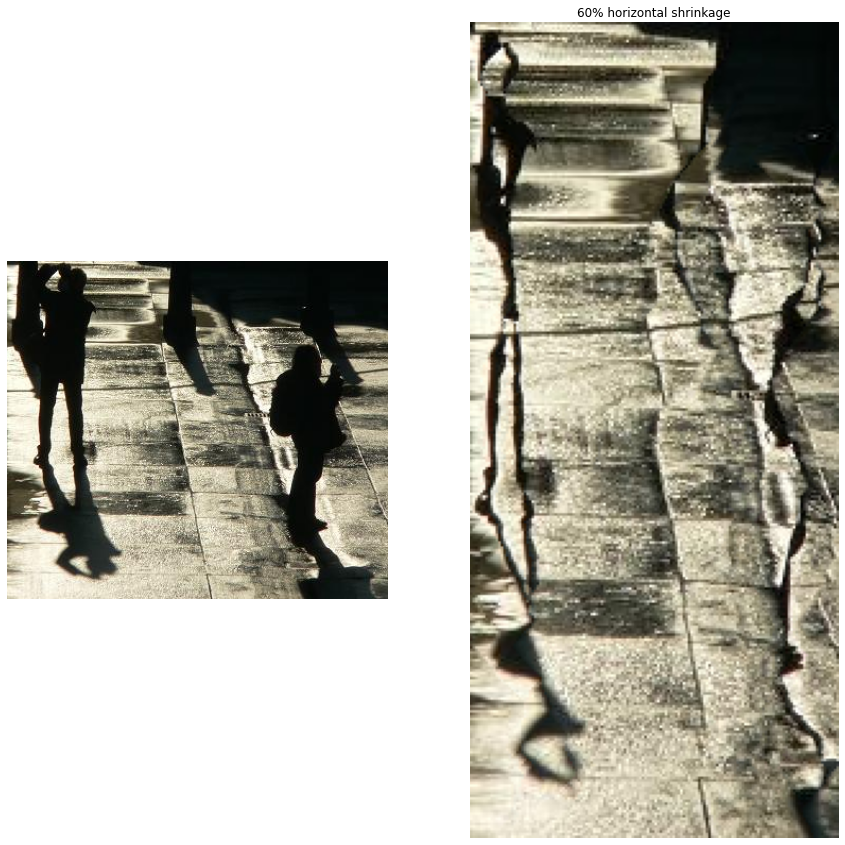

time taken : 7.214190721511841 seconds
----------------------------------------------------------------------------------------------------------------


In [14]:
img = cv2.imread('./images/trafalgar-square.jpg')
img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)

time_taken = time_horizontal_carving(img, 20)
time_taken = time_horizontal_carving(img, 40)
time_taken = time_horizontal_carving(img, 60)

## Uluru

Size of original image : 378, 504
Size of 20% horizontal shrinked image : 378, 404


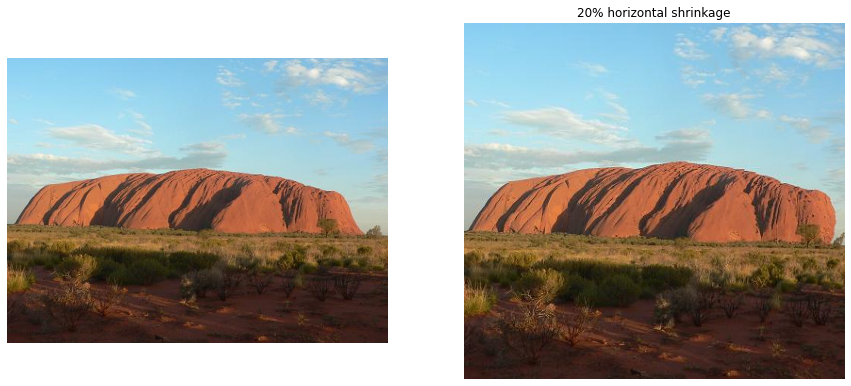

time taken : 7.520815372467041 seconds
----------------------------------------------------------------------------------------------------------------
Size of original image : 378, 504
Size of 40% horizontal shrinked image : 378, 303


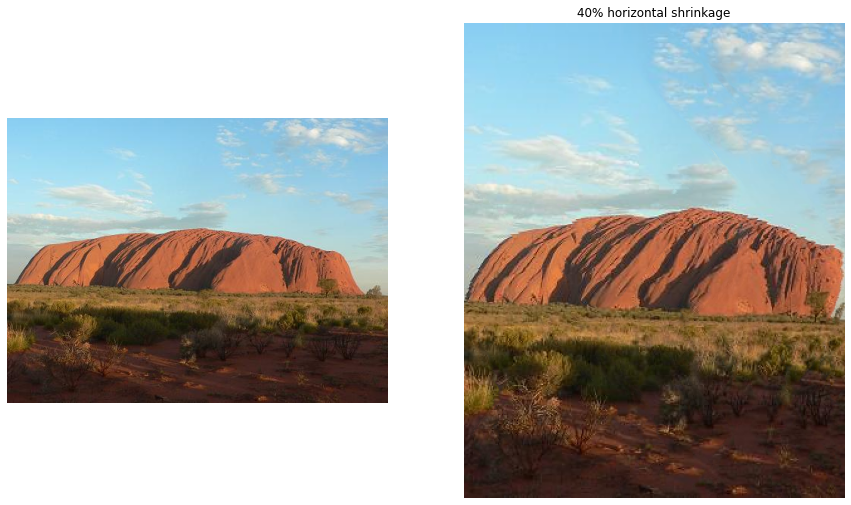

time taken : 11.897628545761108 seconds
----------------------------------------------------------------------------------------------------------------
Size of original image : 378, 504
Size of 60% horizontal shrinked image : 378, 202


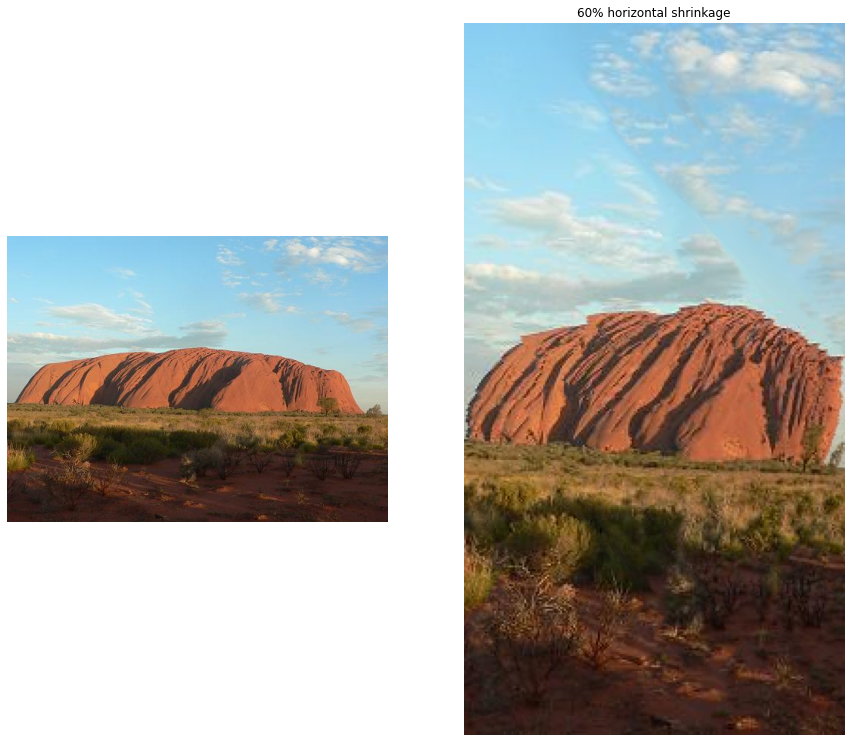

time taken : 17.523444652557373 seconds
----------------------------------------------------------------------------------------------------------------


In [15]:
img = cv2.imread('./images/uluru.jpg')
img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)

time_taken = time_horizontal_carving(img, 20)
time_taken = time_horizontal_carving(img, 40)
time_taken = time_horizontal_carving(img, 60)

## Path

Size of original image : 500, 375
Size of 20% vertically shrinked image : 425, 375


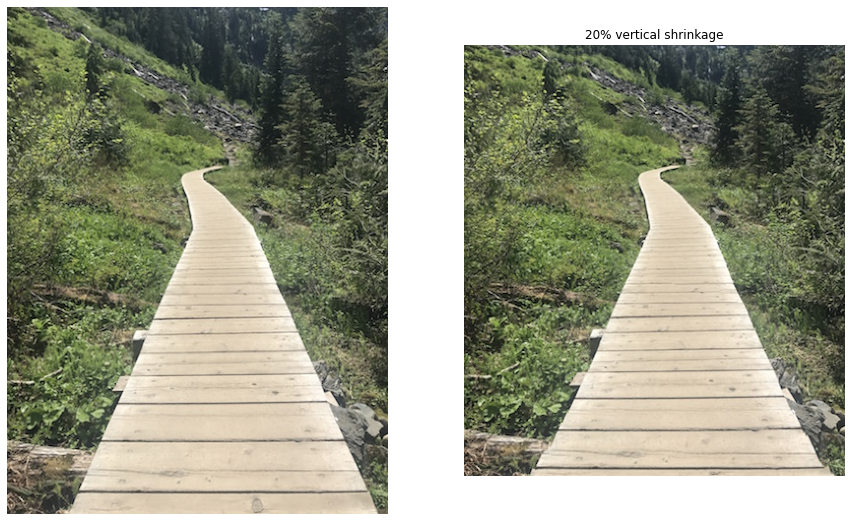

time taken : 5.6832826137542725 seconds
----------------------------------------------------------------------------------------------------------------
Size of original image : 500, 375
Size of 40% vertically shrinked image : 350, 375


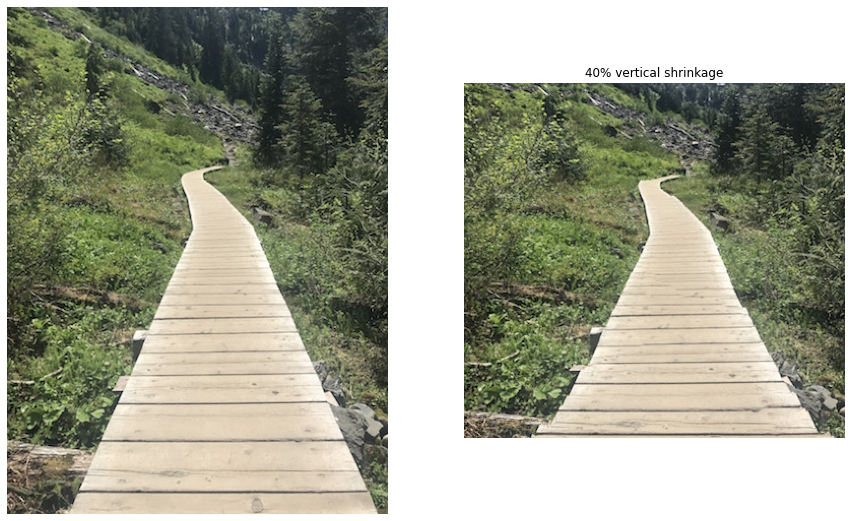

time taken : 9.422648906707764 seconds
----------------------------------------------------------------------------------------------------------------
Size of original image : 500, 375
Size of 60% vertically shrinked image : 275, 375


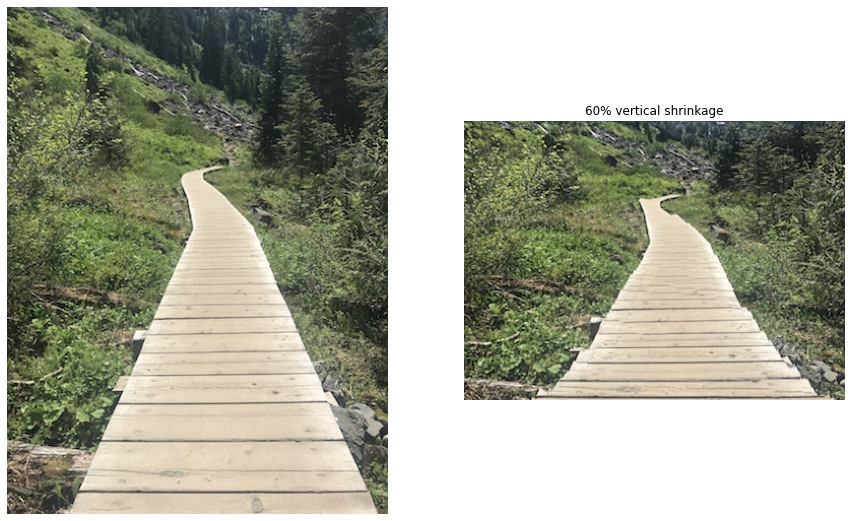

time taken : 12.503493785858154 seconds
----------------------------------------------------------------------------------------------------------------


In [24]:
img = cv2.imread('./images/path.jpg')
img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)

time_taken = time_vertical_carving(img, 20)
time_taken = time_vertical_carving(img, 40)
time_taken = time_vertical_carving(img, 60)

### Time taken for shrinking

| Image | 20% | 40% | 60% |
| ----------- | ----------- | ----------- | ----------- |
| bangalore dancers | 7.64s | 13.30s | 15.18s |
| cat | 0.27s | 0.61s | 0.72s |
| chhotta bheem | 398.07s | 632.36s | 623.89s |
| iiit | 25.79s | 45.49s | 60.30s |
| shadow | 7.90s | 12.27s | 16.50s |
| tanjore | 22.34s | 37.77s | 47.82s |
| trafalgar square | 3.80s | 6.75s | 7.21s |
| uluru | 7.52s | 11.89s | 17.52s |
| path | 5.68s | 9.42s | 12.50s |